In [ ]:
#!/usr/bin/env python
# coding: utf-8

In [1]:
import os
import pandas as pd
import numpy as np
#import autoviz
import bamboolib as bam
from dataprep.eda import create_report
#from autoviz.AutoViz_Class import AutoViz_Class

NumExpr defaulting to 8 threads.


In [2]:
import plotly.express as px

In [3]:
loc = '/Users/kartikeya/Documents/Study/IPBA/Project'
os.chdir(loc)

In [4]:
df = pd.read_csv('ConsumerElectronics.csv', sep=',', decimal='.')

In [47]:
df.isnull().sum()

fsn_id                              0
order_date                          0
Year                                0
Month                               0
order_id                            0
order_item_id                       0
gmv                              4904
units                               0
deliverybdays                       0
deliverycdays                       0
s1_fact.order_payment_type          0
sla                                 0
cust_id                             0
pincode                             0
product_analytic_category           0
product_analytic_sub_category       0
product_analytic_vertical           0
product_mrp                         0
product_procurement_sla             0
dtype: int64

In [151]:
df.head(5)

,fsn_id,order_date,Year,Month,order_id,order_item_id,gmv,units,deliverybdays,deliverycdays,s1_fact.order_payment_type,sla,cust_id,pincode,product_analytic_super_category,product_analytic_category,product_analytic_sub_category,product_analytic_vertical,product_mrp,product_procurement_sla
0,ACCCX3S58G7B5F6P,2015-10-17 15:11:54,2015,10,3.419301e+15,3.419301e+15,6400,1,\N,\N,COD,5,-1.01299130778588E+018,-7.79175582905735E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
1,ACCCX3S58G7B5F6P,2015-10-19 10:07:22,2015,10,1.420831e+15,1.420831e+15,6900,1,\N,\N,COD,7,-8.99032457905512E+018,7.33541149097431E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,7190,0
2,ACCCX3S5AHMF55FV,2015-10-20 15:45:56,2015,10,2.421913e+15,2.421913e+15,1990,1,\N,\N,COD,10,-1.0404429420466E+018,-7.47768776228657E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
3,ACCCX3S5AHMF55FV,2015-10-14 12:05:15,2015,10,4.416592e+15,4.416592e+15,1690,1,\N,\N,Prepaid,4,-7.60496084352714E+018,-5.83593163877661E+018,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3
4,ACCCX3S5AHMF55FV,2015-10-17 21:25:03,2015,10,4.419525e+15,4.419525e+15,1618,1,\N,\N,Prepaid,6,2.8945572083453E+018,5.34735360997242E+017,CE,CameraAccessory,CameraAccessory,CameraTripod,2099,3


In [6]:
df.columns

Index(['fsn_id', 'order_date', 'Year', 'Month', 'order_id', 'order_item_id',
       'gmv', 'units', 'deliverybdays', 'deliverycdays',
       's1_fact.order_payment_type', 'sla', 'cust_id', 'pincode',
       'product_analytic_super_category', 'product_analytic_category',
       'product_analytic_sub_category', 'product_analytic_vertical',
       'product_mrp', 'product_procurement_sla'],
      dtype='object')

In [7]:
df['product_analytic_category'].unique()

array(['CameraAccessory', 'GamingHardware', 'EntertainmentSmall',
       'GameCDDVD', 'Camera'], dtype=object)

In [8]:
df['product_analytic_sub_category'].unique()

array(['CameraAccessory', 'GamingAccessory', 'Speaker', 'HomeAudio',
       'CameraStorage', 'AmplifierReceiver', 'AudioMP3Player', 'Game',
       'Camera', 'GamingConsole', 'HomeTheatre', 'AudioAccessory',
       'TVVideoSmall', 'GameMembershipCards'], dtype=object)

In [9]:
df['product_analytic_vertical'].unique()

array(['CameraTripod', 'Lens', 'CameraBag', 'Flash', 'CameraBattery',
       'CameraBatteryCharger', 'GamePad', 'GamingAccessoryKit',
       'GamingHeadset', 'GamingMemoryCard', 'MotionController',
       'GamingMouse', 'GamingAdapter', 'TVOutCableAccessory', 'GamingGun',
       'JoystickGamingWheel', 'LaptopSpeaker', 'HomeAudioSpeaker',
       'MobileSpeaker', 'CameraRemoteControl', 'Binoculars', 'Filter',
       'GamingMousePad', 'CameraStorageMemoryCard', 'Strap',
       'GamingKeyboard', 'Dock', '\\N', 'SlingBox', 'GamingSpeaker',
       'CoolingPad', 'AmplifierReceiver', 'AudioMP3Player',
       'PhysicalGame', 'BoomBox', 'DSLR', 'Point & Shoot',
       'Instant Cameras', 'Camcorders', 'SportsAndAction',
       'CameraBatteryGrip', 'CameraAccessory', 'CameraFilmRolls',
       'CodeInTheBoxGame', 'CameraMount', 'DockingStation',
       'DJController', 'ExtensionTube', 'FMRadio', 'GamingConsole',
       'HandheldGamingConsole', 'HiFiSystem', 'HomeTheatre',
       'KaraokePlayer', 'M

In [10]:
df.drop('product_analytic_super_category',axis=1, inplace=True)

In [11]:
df['order_date'] = pd.to_datetime(df['order_date'], infer_datetime_format=True)
df['gmv'] = pd.to_numeric(df['gmv'], downcast='integer', errors='coerce')
df['s1_fact.order_payment_type'] = df['s1_fact.order_payment_type'].astype('string')
df['cust_id'] = df['cust_id'].astype('string')
df['pincode'] = df['pincode'].astype('string')
df['product_analytic_category'] = df['product_analytic_category'].astype('string')
df['product_analytic_sub_category'] = df['product_analytic_sub_category'].astype('string')
df['product_analytic_vertical'] = df['product_analytic_vertical'].astype('string')

In [12]:
df.describe()

,Year,Month,order_id,order_item_id,gmv,units,sla,product_mrp,product_procurement_sla
count,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.643920e+06,1.648824e+06,1.648824e+06,1.648824e+06,1.648824e+06
mean,2.015519e+03,6.585650e+00,2.842445e+15,1.375628e+16,2.461124e+03,1.022087e+00,5.687832e+00,4.108309e+03,5.403451e+00
std,4.996557e-01,3.623351e+00,1.269134e+15,5.594598e+16,5.618842e+03,2.535318e-01,2.983336e+00,8.510918e+03,5.346618e+01
min,2.015000e+03,1.000000e+00,7.633152e+07,1.080165e+08,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,-1.000000e+00
25%,2.015000e+03,3.000000e+00,1.602589e+15,1.606725e+15,3.400000e+02,1.000000e+00,4.000000e+00,7.990000e+02,1.000000e+00
50%,2.016000e+03,6.000000e+00,2.611825e+15,2.619185e+15,7.500000e+02,1.000000e+00,6.000000e+00,1.599000e+03,2.000000e+00
75%,2.016000e+03,1.000000e+01,3.610614e+15,4.397706e+15,1.999000e+03,1.000000e+00,7.000000e+00,3.499000e+03,3.000000e+00
max,2.016000e+03,1.200000e+01,5.395077e+15,3.000373e+17,2.269470e+05,5.000000e+01,1.006000e+03,2.999990e+05,1.000000e+03


In [13]:
df2 = df.groupby(['product_analytic_category']).agg(gmv_sum=('gmv', 'sum')).reset_index()
df2

,product_analytic_category,gmv_sum
0,Camera,1.780719e+09
1,CameraAccessory,3.035625e+08
2,EntertainmentSmall,1.293196e+09
3,GameCDDVD,2.137482e+08
4,GamingHardware,4.546653e+08


In [27]:
fig = px.bar(df2, x='gmv_sum', y='product_analytic_category')
fig

In [15]:
df6 = df.groupby(['product_analytic_category']).agg(product_analytic_category_count=('product_analytic_category', 'count')).reset_index()
df6

,product_analytic_category,product_analytic_category_count
0,Camera,101172
1,CameraAccessory,257493
2,EntertainmentSmall,944698
3,GameCDDVD,114503
4,GamingHardware,230958


In [16]:
fig2 = px.bar(df6, x='product_analytic_category_count', y='product_analytic_category')
fig2

In [17]:
df['product_analytic_category'].value_counts().sort_values(ascending=False)

EntertainmentSmall    944698
CameraAccessory       257493
GamingHardware        230958
GameCDDVD             114503
Camera                101172
Name: product_analytic_category, dtype: Int64

In [18]:
gmv_sum = df.groupby("product_analytic_category")['gmv'].sum()

In [19]:
gmv_sum.sort_values(ascending=False)

product_analytic_category
Camera                1.780719e+09
EntertainmentSmall    1.293196e+09
GamingHardware        4.546653e+08
CameraAccessory       3.035625e+08
GameCDDVD             2.137482e+08
Name: gmv, dtype: float64

In [20]:
gmvpersale = gmv_sum.sort_values(ascending=False)/df['product_analytic_category'].value_counts().sort_values(ascending=False)

In [21]:
gmvpersale

Camera                17600.907222
CameraAccessory        1178.915672
EntertainmentSmall     1368.899011
GameCDDVD              1866.747215
GamingHardware         1968.605983
dtype: Float64

In [22]:
df3 = df.groupby(['Month']).agg(gmv_sum=('gmv', 'sum')).reset_index()

In [23]:
fig3 = px.bar(df3, x='Month', y='gmv_sum')
fig3

In [24]:
df4 = df.groupby(['Month']).agg(Month_count=('Month', 'count')).reset_index()

In [28]:
fig4 = px.bar(df4, x='Month', y='Month_count')
fig4

In [26]:
df5 = df.groupby(['product_analytic_sub_category']).agg(gmv_sum=('gmv', 'sum')).reset_index()

In [29]:
fig6 = px.bar(df5, x='gmv_sum', y='product_analytic_sub_category')
fig6

In [30]:
df.corr(method='pearson').sort_values(by='sla',ascending = False)

,Year,Month,order_id,order_item_id,gmv,units,sla,product_mrp,product_procurement_sla
sla,-0.008341,-0.023443,-0.022633,-0.003728,-0.124474,-0.012576,1.000000,-0.132165,-0.033202
order_item_id,-0.162142,0.103273,0.077869,1.000000,-0.015029,-0.001615,-0.003728,-0.018336,-0.004233
Year,1.000000,-0.898153,0.178683,-0.162142,0.016315,-0.010445,-0.008341,0.012682,0.009624
units,-0.010445,0.009521,-0.001668,-0.001615,0.042583,1.000000,-0.012576,-0.015098,-0.001218
order_id,0.178683,-0.048569,1.000000,0.077869,0.012510,-0.001668,-0.022633,0.013197,0.003524
Month,-0.898153,1.000000,-0.048569,0.103273,-0.005232,0.009521,-0.023443,-0.004171,-0.002960
product_procurement_sla,0.009624,-0.002960,0.003524,-0.004233,0.000560,-0.001218,-0.033202,-0.004062,1.000000
gmv,0.016315,-0.005232,0.012510,-0.015029,1.000000,0.042583,-0.124474,0.904090,0.000560
product_mrp,0.012682,-0.004171,0.013197,-0.018336,0.904090,-0.015098,-0.132165,1.000000,-0.004062


In [40]:
from scipy.stats import norm
import statistics
import matplotlib.pyplot as plt

In [72]:
mean_gmv = gmv_notnull["gmv"].mean()
sd_gmv = gmv_notnull["gmv"].std()

In [73]:
mean_gmv

2461.1241019711447

In [74]:
sd_gmv

5618.842236012783

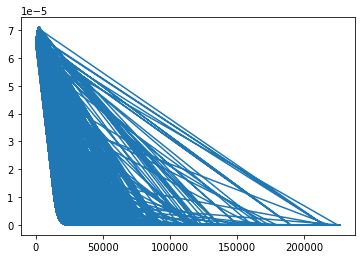

In [75]:
fig7 = plt.plot(gmv_notnull['gmv'],norm.pdf(gmv_notnull['gmv'],mean_gmv,sd_gmv))

In [83]:
mean_sla = df['sla'].mean()
std_sla = df['sla'].std()

<AxesSubplot:>

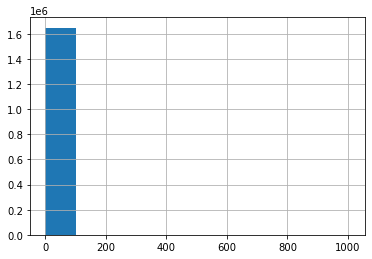

In [88]:
df["sla"].hist()

In [93]:
#BoxPlot

In [92]:
fig5 = px.box(df.sample(n=100000, replace=False, random_state=123).sort_index().dropna(subset=['gmv']), x='product_analytic_category', y='gmv')
fig5